# Gacha GT for *Meet the Fellows*

In [1]:
from manim import *

/Users/simple/Library/Python/3.9/lib/python/site-packages/urllib3/__init__.py:35: NotOpenSSLWarning: urllib3 v2 only supports OpenSSL 1.1.1+, currently the 'ssl' module is compiled with 'LibreSSL 2.8.3'. See: https://github.com/urllib3/urllib3/issues/3020
  warnings.warn(


Manim Community v0.18.0

## Preparation

In [2]:
def Emoji(text):
    res = 512
    u_string = '_'.join(f'{ord(c):x}' for c in text)
    path = f"noto-emoji-main/png/512/emoji_u{u_string}.png"
    emoji = ImageMobject(path)
    return emoji

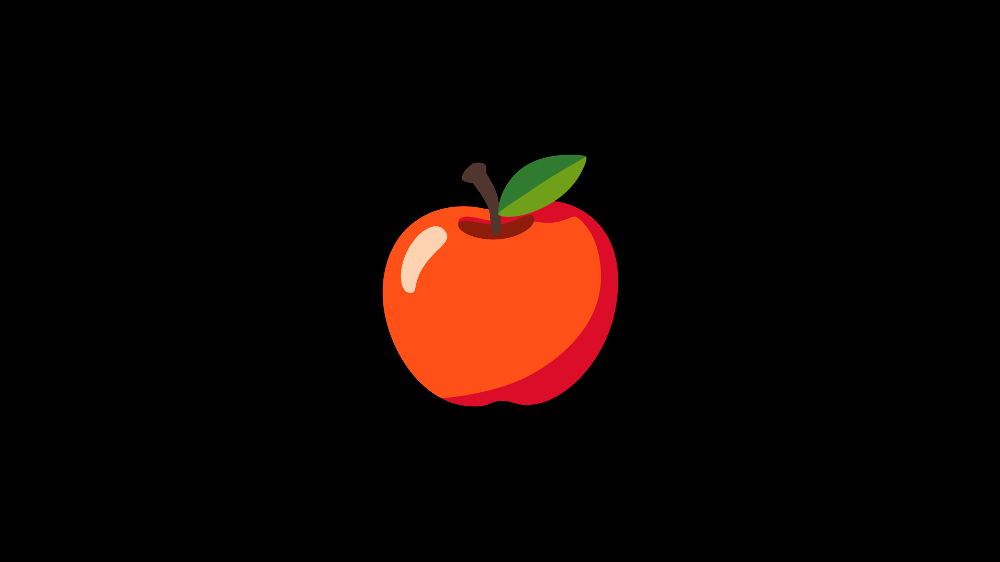

In [3]:
%%manim -qh -v WARNING Z_EmojiTest
class Z_EmojiTest(Scene):
    def construct(self):
        e = Emoji('🍎')
        self.add(e)

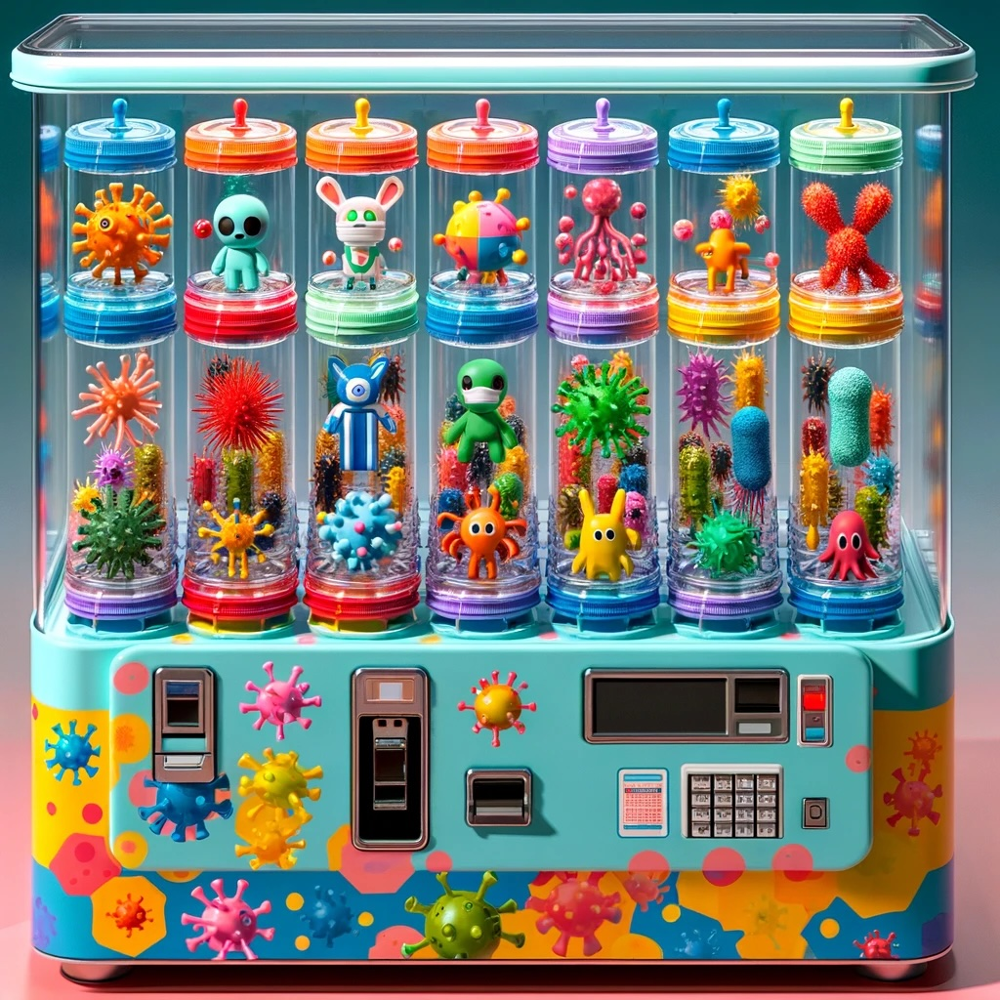

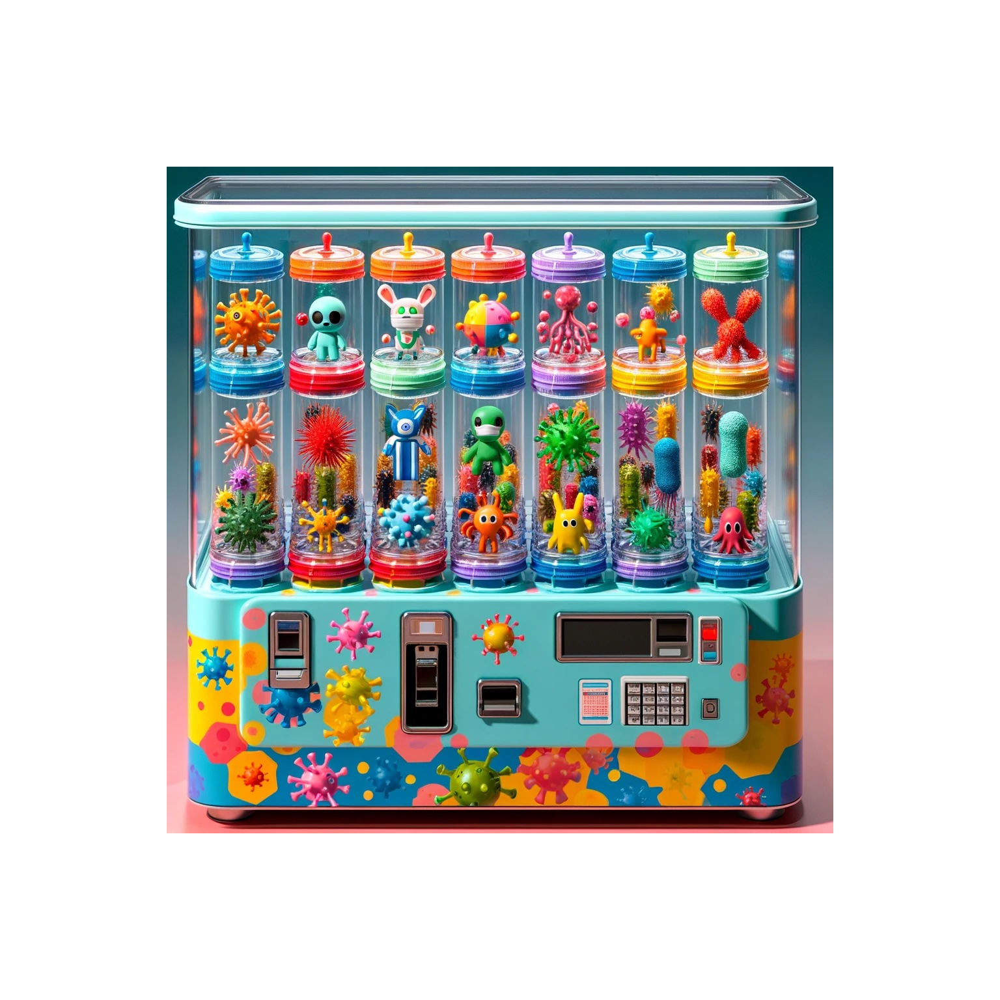

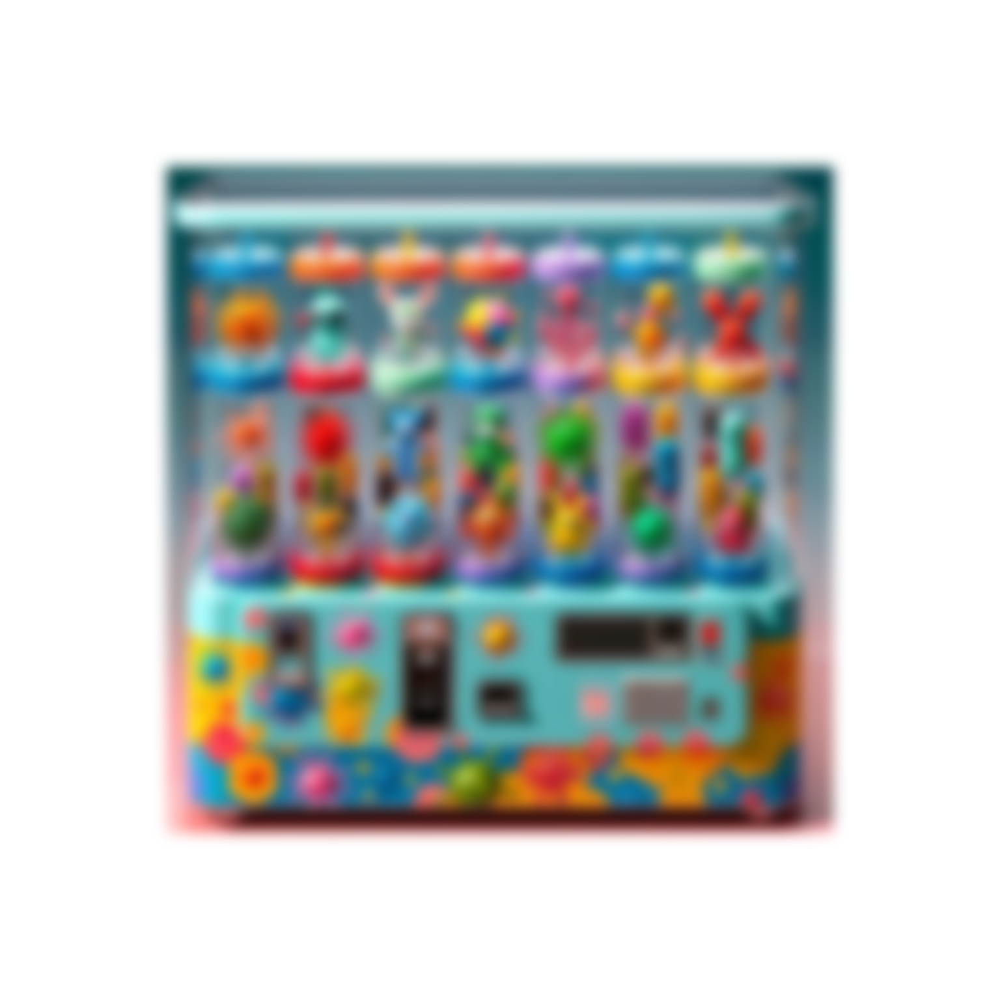

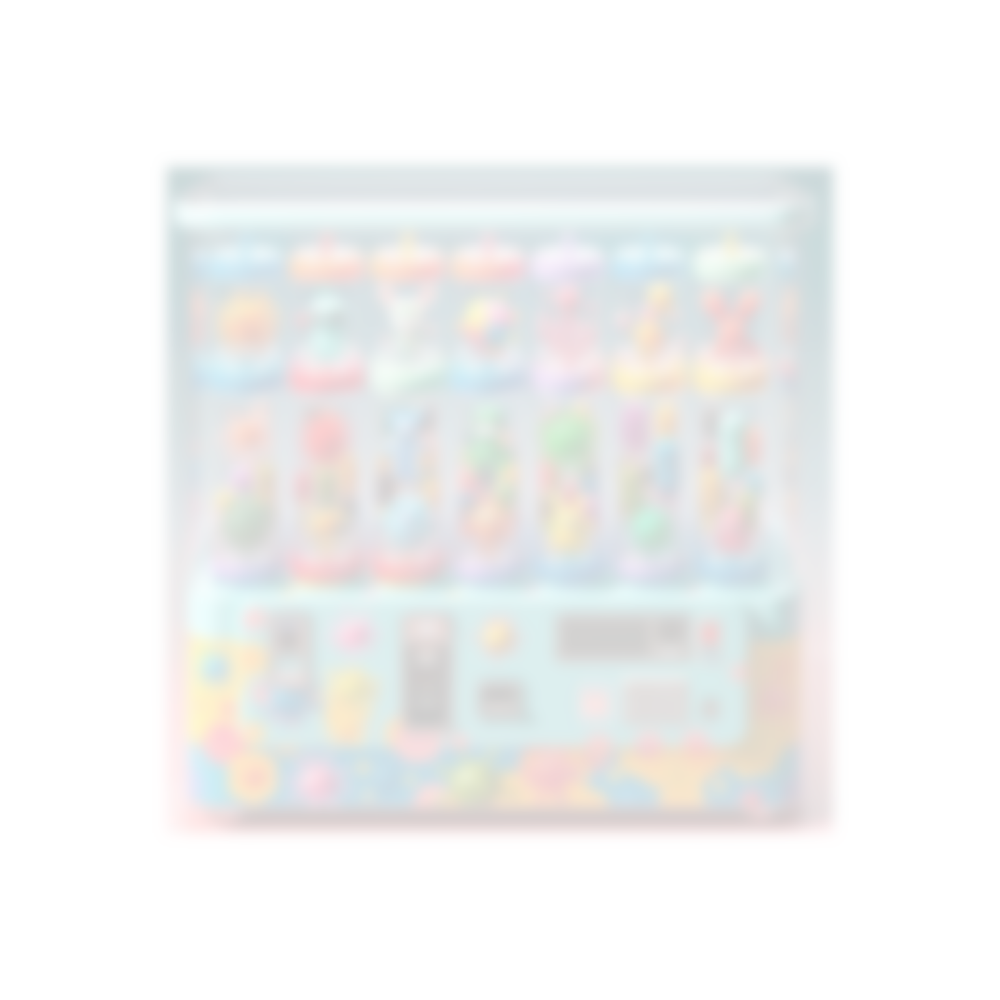

In [4]:
from PIL import Image, ImageFilter

old = Image.open('gacha.jpg')
width, height = old.size
new_width = width + 512
new_height = height + 512
big = Image.new(old.mode, [new_width, new_height], 'white')
big.paste(old, [256, 256])
blur = big.filter(ImageFilter.GaussianBlur(radius=10))
alpha = 1/5
white = np.asarray(blur) * alpha + 255 * (1 - alpha)
white = Image.fromarray(white.astype('uint8'))
display(old, big, blur, white)

In [5]:
bg = ImageMobject(white)
bg.scale(2).shift([0, -2, 0])

ImageMobject

In [6]:
rulers = VGroup()
for x in range(-7, 8, 2):
    l = Line((x, 10, 0), (x, -10, 0), stroke_width=100)
    rulers += l
for y in range(-3, 5, 2):
    l = Line((-10, y, 0), (10, y, 0), stroke_width=100)
    rulers += l
rulers.set_color('#808080').set_opacity(5/255)

VGroup(Line, Line, Line, Line, Line, Line, Line, Line, Line, Line, Line, Line)

In [7]:
rng = np.random.default_rng()

In [8]:
mosaic = VGroup()
for x in range(-10, 10):
    for y in range(-10, 10):
        c = ManimColor.from_hsv([rng.random(), 0.9, 0.9])
        r = Rectangle(c, 1, 1, stroke_width=0)
        r.shift([x, y, 0])
        mosaic += r
mosaic.set_opacity(0.05)

VGroup(Rectangle, Rectangle, Rectangle, Rectangle, Rectangle, Rectangle, Rectangle, Rectangle, Rectangle, Rectangle, Rectangle, Rectangle, Rectangle, Rectangle, Rectangle, Rectangle, Rectangle, Rectangle, Rectangle, Rectangle, Rectangle, Rectangle, Rectangle, Rectangle, Rectangle, Rectangle, Rectangle, Rectangle, Rectangle, Rectangle, Rectangle, Rectangle, Rectangle, Rectangle, Rectangle, Rectangle, Rectangle, Rectangle, Rectangle, Rectangle, Rectangle, Rectangle, Rectangle, Rectangle, Rectangle, Rectangle, Rectangle, Rectangle, Rectangle, Rectangle, Rectangle, Rectangle, Rectangle, Rectangle, Rectangle, Rectangle, Rectangle, Rectangle, Rectangle, Rectangle, Rectangle, Rectangle, Rectangle, Rectangle, Rectangle, Rectangle, Rectangle, Rectangle, Rectangle, Rectangle, Rectangle, Rectangle, Rectangle, Rectangle, Rectangle, Rectangle, Rectangle, Rectangle, Rectangle, Rectangle, Rectangle, Rectangle, Rectangle, Rectangle, Rectangle, Rectangle, Rectangle, Rectangle, Rectangle, Rectangle, Rec

In [9]:
noto = TexTemplate(tex_compiler='lualatex', preamble=
                   r'\usepackage{amsmath, amssymb}'
                   r'\usepackage{fontspec}'
                   r'\setmainfont{Noto Sans Light}'
                   )

In [10]:
default_color = '#0099BB'
structure_color = '#006699'

Text.set_default(color=default_color, stroke_width=1,font='Noto Sans Display', weight='LIGHT')
Tex.set_default(color=default_color, stroke_width=1, tex_template=noto)
MathTex.set_default(color=default_color, stroke_width=1, tex_template=noto)
Line.set_default(color=default_color)

## Title

In [ ]:
%%manim -qh -v WARNING A1_Welcome
class                  A1_Welcome(Scene):
    """
    Good morning.
    Today I want to share with you how to construct
    a group testing scheme using the idea of list recoverable codes.
    """
    def construct(self):
        title1 = Text('Group Testing via', font_size=120)
        title2 = Text('Stacked List Recoverable Codes', font_size=70)
        author1 = Text('Hsin-Po Wang (joint with Venkatesan Guruswami)',
                       font_size=45)
        title1.shift([0, 2, 0]).set_color(structure_color)
        title2.shift([0, 0.5, 0]).set_color(structure_color)
        author1.shift([0, -2, 0])
        self.add(bg)
        self.add(title1, title2, author1)
        self.play(ApplyWave(title2))

## GT Rule

In [12]:
text_rule = Text('Group Testing Rule', font_size=100)
text_rule.shift([0, 3, 0]).set_color(structure_color)
infected = [(1, 2), (3, 0), (4, 0)]
students = []
for x in range(5):
    for y in range(3):
        s = Emoji('🧑‍🎓')
        s.scale(1/3).shift([x * 2, y * 2, 0])
        students.append(s)
        if (x, y) in infected:
            v = Emoji('🦠')
            v.scale(1/3).shift([x * 2, y * 2, 0]).shift([1/3, 1/3, 0])
            students.append(v)
students = Group(*students)
students.shift([-2, -3, 0])

Group

In [ ]:
%%manim -qh -v WARNING B1_Rule
class                  B1_Rule(Scene):
    """
    The motivation of group testing is as follows.
    Here is a set of students; some of them have bacteria icons.
    Those are sick students.
    We can test whether or not each student is sick,
    as shown in the animation.
    """
    def construct(self):
        r1 = Rectangle('orange', 2, 2)
        r2 = Rectangle('teal', 2, 2)
        r3 = Rectangle('orange', 2, 2)
        r4 = Rectangle('teal', 2, 2)
        r5 = Rectangle('orange', 2, 2)
        t1 = Text('negative', font_size=75, color='orange')
        t2 = Text('positive', font_size=75, color='teal')
        t3 = Text('negative', font_size=75, color='orange')
        t4 = Text('positive', font_size=75, color='teal')
        t5 = Text('negative', font_size=75, color='orange')
        r1.scale(0.9).shift([0, -3, 0])
        r2.scale(0.9).shift([0, 1, 0])
        r3.scale(0.9).shift([4, 1, 0])
        r4.scale(0.9).shift([4, -3, 0])
        r5.scale(0.9).shift([0, -3, 0])
        t1.shift([-5, -1, 0])
        t2.shift([-5, -1, 0])
        t3.shift([-5, -1, 0])
        t4.shift([-5, -1, 0])
        t5.shift([-5, -1, 0])
        self.add(bg)
        self.add(text_rule, students)
        self.add(r1, t1)
        self.play(ReplacementTransform(r1, r2),
                  ReplacementTransform(t1, t2), run_time=1)
        self.wait(1)
        self.play(ReplacementTransform(r2, r3),
                  ReplacementTransform(t2, t3), run_time=1)
        self.wait(1)
        self.play(ReplacementTransform(r3, r4),
                  ReplacementTransform(t3, t4), run_time=1)
        self.wait(1)
        self.play(ReplacementTransform(r4, r5),
                  ReplacementTransform(t4, t5), run_time=1)
        self.wait(1)
        self.add(bg)
        self.add(text_rule, students)

In [ ]:
%%manim -qh -v WARNING B2_Examples
class                  B2_Examples(Scene):
    """
    To save money and time, we can test a subset of students,
    For instance, we can test this subset
    and the test result is positive.
    We can select another subset of students,
    this time the test result is negative.
    Note that the test result does not tell you
    how many students are sick, only positive or negative.
    """
    def construct(self):
        r1 = Rectangle('teal', 4, 6)
        r2 = Rectangle('orange', 4, 6)
        r3 = Rectangle('teal', 4, 6)
        r4 = Rectangle('orange', 4, 6)
        r5 = Rectangle('teal', 4, 6)
        t1 = Text('positive', font_size=75, color='teal')
        t2 = Text('negative', font_size=75, color='orange')
        t3 = Text('positive', font_size=75, color='teal')
        t4 = Text('negative', font_size=75, color='orange')
        t5 = Text('positive', font_size=75, color='teal')
        r1.scale(0.9).shift([0, 0, 0])
        r2.scale(0.9).shift([4, 0, 0])
        r3.scale(0.9).shift([4, -2, 0])
        r4.scale(0.9).shift([0, -2, 0])
        r5.scale(0.9).shift([0, 0, 0])
        t1.shift([-5, -1, 0])
        t2.shift([-5, -1, 0])
        t3.shift([-5, -1, 0])
        t4.shift([-5, -1, 0])
        t5.shift([-5, -1, 0])
        self.add(bg)
        self.add(text_rule, students)
        self.add(r1, t1)
        self.play(ReplacementTransform(r1, r2),
                  ReplacementTransform(t1, t2), run_time=1)
        self.wait(1)
        self.play(ReplacementTransform(r2, r3),
                  ReplacementTransform(t2, t3), run_time=1)
        self.wait(1)
        self.play(ReplacementTransform(r3, r4),
                  ReplacementTransform(t3, t4), run_time=1)
        self.wait(1)
        self.play(ReplacementTransform(r4, r5),
                  ReplacementTransform(t4, t5), run_time=1)
        self.wait(1)

In [15]:
text_formula = Text('Group Testing Math Formulation', font_size=70)
text_formula.shift([0, 3, 0]).set_color(structure_color)

Text('Group Testing Math Formulation')

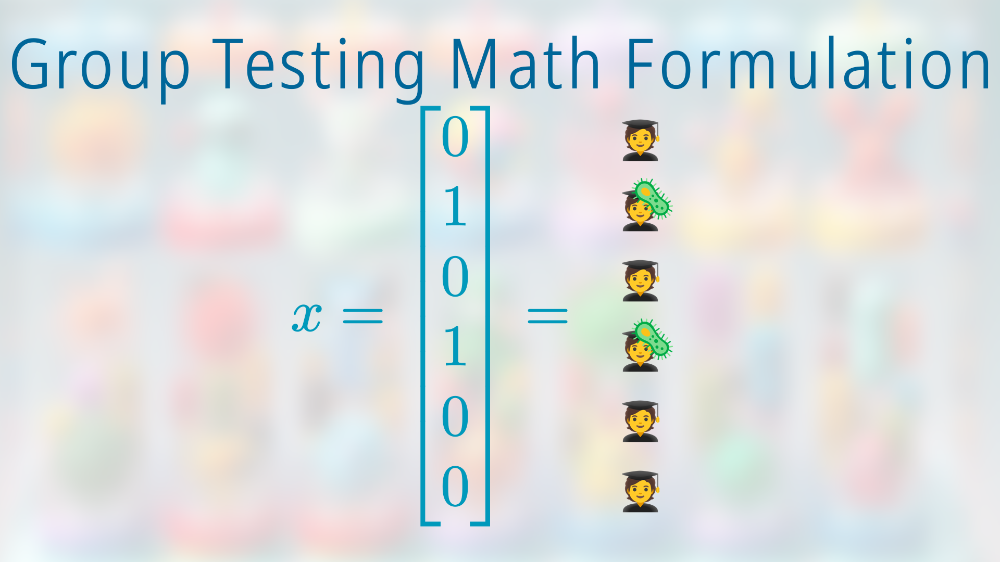

In [16]:
%%manim -qh -v WARNING B3_Unknown
class                  B3_Unknown(Scene):
    """
    To study group testing more seriously,
    here is a mathematical formulation.
    We use a binary vector x to indicate
    whether or not each student is sick.
    In this example, the second and the fourth students
    are sick, so the second and the fourth entry of x are 1.
    Other entries of x are 0.
    """
    def construct(self):
        t1 = r'''
            $$x = \begin{bmatrix}
                0 \\ 1 \\ 0 \\ 1 \\ 0 \\ 0
            \end{bmatrix} = $$
        '''
        t1 = Tex(t1, font_size=80)
        infected = [(0, 2), (0, 4)]
        students = []
        for x in range(1):
            for y in range(6):
                s = Emoji('🧑‍🎓')
                s.scale(1/6).shift([x, y, 0])
                students.append(s)
                if (x, y) in infected:
                    v = Emoji('🦠')
                    v.scale(1/6).shift([x, y, 0]).shift([1/6, 1/6, 0])
                    students.append(v)
        students = Group(*students)
        t1.shift([-1, -0.5, 0])
        students.shift([2, -3, 0])
        self.add(bg)
        self.add(text_formula, students, t1)

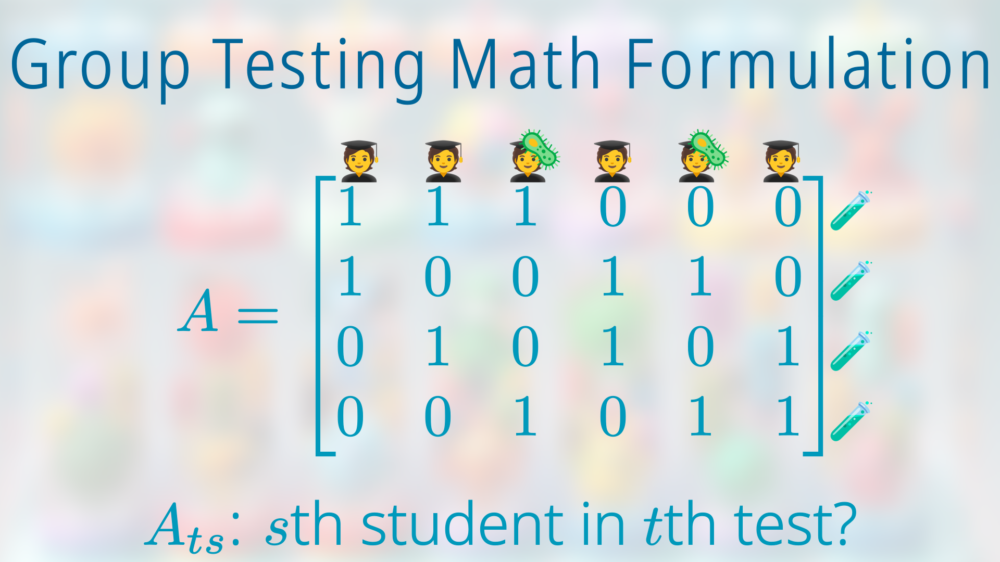

In [17]:
%%manim -qh -v WARNING B4_Matrix
class                  B4_Matrix(Scene):
    """
    We use a matrix to indicate how we arrange tests for students
    In particular, Ats means whether or not we want
    the student number s to participates in the test number t
    """
    def construct(self):
        t1 = r'''
            $$A = \begin{bmatrix}
                1 & 1 & 1 & 0 & 0 & 0 \\
                1 & 0 & 0 & 1 & 1 & 0 \\
                0 & 1 & 0 & 1 & 0 & 1 \\
                0 & 0 & 1 & 0 & 1 & 1
            \end{bmatrix}$$
        '''
        t1 = Tex(t1, font_size=80)
        t2 = Tex(r'$A_{ts}$: $s$th student in $t$th test?',
                 font_size=80)
        students = []
        for x in range(6):
            s = Emoji('🧑‍🎓')
            s.scale(1/6).shift([x * 1.2, 0, 0])
            students.append(s)
            if x in [2, 4]:
                v = Emoji('🦠')
                v.scale(1/6).shift([x * 1.2, 0, 0]).shift([1/6, 1/6, 0])
                students.append(v)
        students = Group(*students)
        tubes = []
        for y in range(4):
            t = Emoji('🧪')
            t.scale(1/6).shift([0, y*1, 0])
            tubes.append(t)
        tubes = Group(*tubes)
        t1.shift([0, -0.5, 0])
        t2.shift([0, -3.5, 0])
        students.shift([-2, 1.7, 0])
        tubes.shift([5, -2, 0])
        self.add(bg)
        self.add(text_formula, t1, t2, students, tubes)

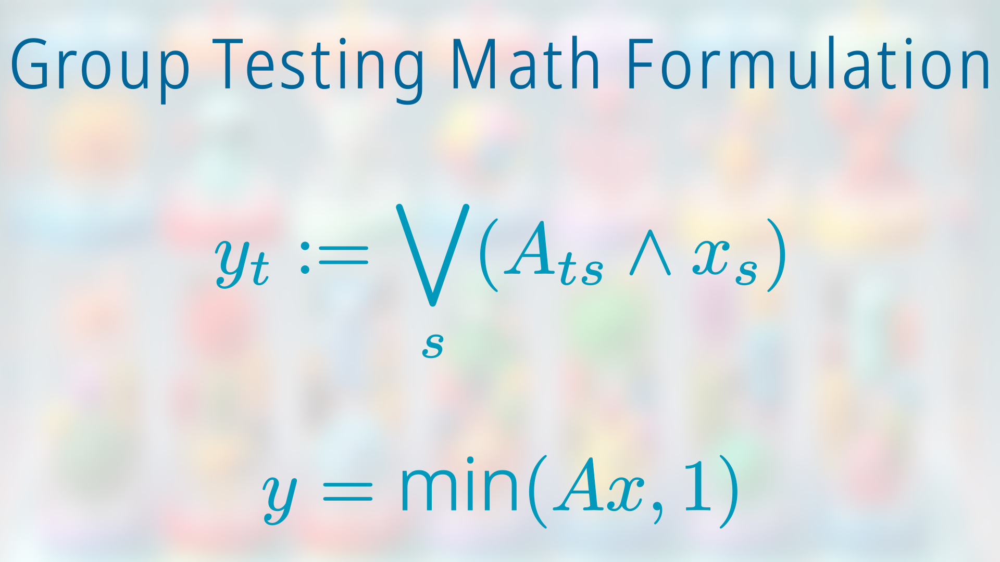

In [18]:
%%manim -qh -v WARNING B5_TestResults
class                  B5_TestResults(Scene):
    """
    The test result is going to be
    one if any of participating student is sick.
    More formally, it is the logical matrix multiplication of A and x.
    Or, if you like it, you can compute the usual matrix multiplication
    and then replace any number greater than 1 by 1.
    """
    def construct(self):
        t1 = r'$$y_t := \bigvee_s (A_{ts} \wedge x_s)$$'
        t1 = Tex(t1, font_size=100)
        t2 = Tex(r'$$y = \min(Ax, 1)$$',font_size=100)
        t1.shift([0, 0, 0])
        t2.shift([0, -3, 0])
        self.add(bg)
        self.add(text_formula, t1, t2)

## GT Goal

In [19]:
text_goal = Text('Group Testing Goal', font_size=120)
text_goal.shift([0, 3, 0]).set_color(structure_color)
text_solve = r'Solve $y = \min(Ax, 1)$'
text_solve = Tex(text_solve, font_size=140, color='#660000')
text_solve.shift([0, 1, 0])

Tex('Solve $y = \\min(Ax, 1)$')

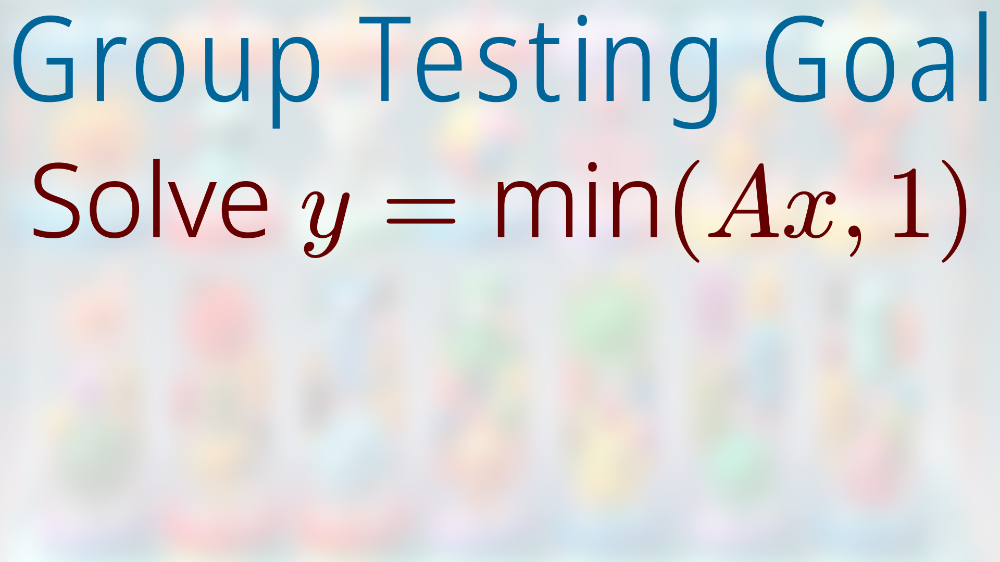

In [20]:
%%manim -qh -v WARNING C1_Solve
class                  C1_Solve(Scene):
    """
    The goal of group testing is to find the sick students.
    In other words, solve for the vector x given y
    using the best matrix A and the best decoder.

    There are some challenges.
    """
    def construct(self):
        self.add(bg)
        self.add(text_goal, text_solve)

In [21]:
ta = Text(r'nonadaptive tests',font_size=80)
tb = Text(r'few tests',font_size=80)
tc = Text(r'noisy tests',font_size=80)
td = Text(r'easy decode',font_size=80)
te = Text(r'few errors',font_size=80)
ta.shift([0, -2, 0])
tb.shift([-4, -0.5, 0])
tc.shift([-4, -3.5, 0])
td.shift([4, -3.5, 0])
te.shift([4, -0.5, 0])

Text('few errors')

In [ ]:
%%manim -qh -v WARNING C2_Goal
class                  C2_Goal(Scene):
    """
    First, we want that tests can be performed in parallel,
    so we need nonadaptive tests
    Second, we want that there are as few tests as possible.
    Third, we want to be able to resists noisy test results.
    And then, we want an low complexity decoder.
    Finally, we want that our decoder makes as few errors as possible.
    """
    def construct(self):
        self.add(bg)
        self.add(text_goal, text_solve)
        self.play(Write(ta), run_time=4)
        self.play(Write(tb), run_time=4)
        self.play(Write(tc), run_time=4)
        self.play(Write(td), run_time=4)
        self.play(Write(te), run_time=4)

In [23]:
r = 2.5
angles = [2*np.pi * (v/5 + 1/4) for v in range(5)]
lines = [[(0, 0, 0), (r*np.cos(a), r*np.sin(a), 0)] for a in angles]
star = Polygram(*lines, color='gray')

In [ ]:
%%manim -qh -v WARNING C3_Pentagon
class                  C3_Pentagon(Scene):
    """
    In the following we are going to
    review the history of group testing.
    We are going to use this five axis diagram
    to visualize the strength of each group testing work.
    """
    def construct(self):
        ta.generate_target()
        tb.generate_target()
        tc.generate_target()
        td.generate_target()
        te.generate_target()
        ta.target.scale(3/4).move_to([0, 1.5, 0])
        tb.target.scale(3/4).move_to([-4.5, -0.5, 0])
        tc.target.scale(3/4).move_to([-4, -3.5, 0])
        td.target.scale(3/4).move_to([4, -3.5, 0])
        te.target.scale(3/4).move_to([4.5, -0.5, 0])
        star1 = star.copy().shift([0, -1.5, 0])
        self.add(bg)
        self.add(text_goal, ta, tb, tc, td, te)
        self.play(
            MoveToTarget(ta),
            MoveToTarget(tb),
            MoveToTarget(tc),
            MoveToTarget(td),
            MoveToTarget(te),
        run_time=1)
        self.play(GrowFromCenter(star1), run_time=1)

## GT Works

In [25]:
text_work = Text('Group Testing Works', font_size=110)
text_work.shift([0, 3, 0]).set_color(structure_color)

Text('Group Testing Works')

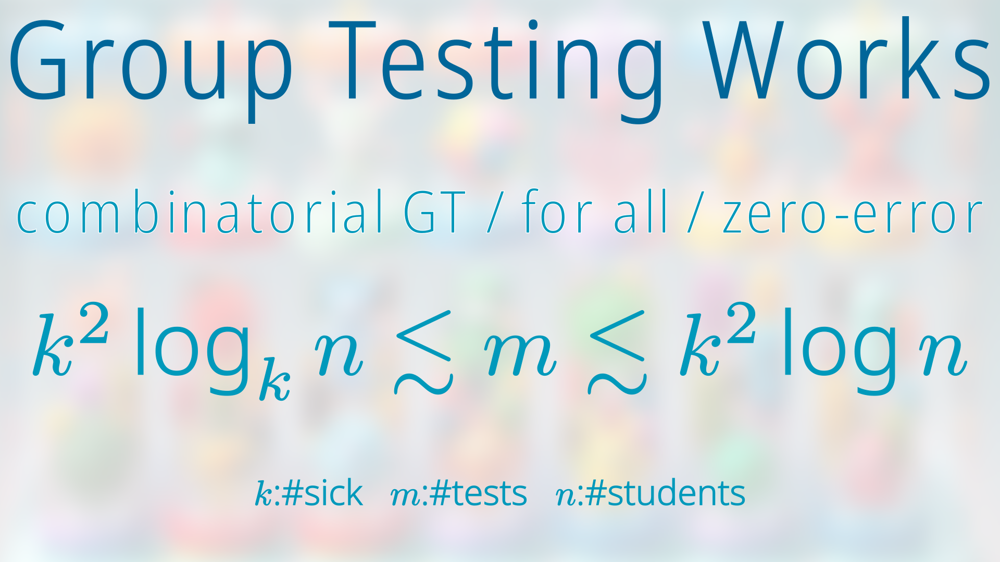

In [26]:
%%manim -qh -v WARNING D1_ForAll
class                  D1_ForAll(Scene):
    """
    In the beginning people worked on zero error group testing.
    It is then proved that you need
    about k^2 tests to achieve zero error.
    Thus the question quickly became finding explicit constructions.
    """
    def construct(self):
        t1 = Text('combinatorial GT / for all / zero-error',
                  font_size=60)
        t2 = Tex(r'$k^2 \log_kn \lesssim m \lesssim k^2 \log n$',
                 font_size=120)
        t3 = Tex(r'$k$:\#sick ~ $m$:\#tests ~ $n$:\#students')
                 
        t1.shift([0, 1, 0])
        t2.shift([0, -1, 0])
        t3.shift([0, -3, 0])
        self.add(bg)
        self.add(text_work, t1, t2, t3)

In [27]:
r = 2.5
labels = [
    Text('adapt'),
    Text('#test'),
    Text('noise'),
    Text('decod'),
    Text('error'),
]
for v in range(5):
    a = angles[v]
    labels[v].shift([r * np.cos(a), r * np.sin(a),0])
arm_text = VGroup(*labels)

def Pentagon(abcde):
    vertices = []
    for v in range(5):
        r = abcde[v] / 2
        x = r * np.cos(angles[v])
        y = r * np.sin(angles[v])
        vertices.append((x, y, 0))
    poly = Polygram(vertices, color='red', stroke_width=20,
                    fill_color='red', fill_opacity=0.5)
    both = VGroup(star.copy(), poly)
    return both

In [28]:
def Paper(citekey, caption, abcde):
    combo = [None] * 5
    combo[0] = Rectangle('gray', 9, 12,  stroke_opacity=0,
                         fill_color='gray', fill_opacity=0.5)
    combo[0].scale(0.7).shift([-3, -1.5, 0])
    combo[1] = ImageMobject(f'papers/{citekey}.png')
    combo[1].scale(0.9).shift([-3, -1.5, 0])
    combo[2] = Tex(caption, font_size=100, color='red')
    combo[2].shift([0, 3, 0])
    combo[3] = arm_text.copy().shift([4, -1, 0])
    combo[4] = Pentagon(abcde).shift([4, -1, 0])
    return combo

In [29]:
def A(): return
def B(): return
def C(): return
def D(): return
def E(): return
(A.na, A.r2, A.rc, A.log, A.m) = (5, 4, 3, 2, 1)
(B.it, B.ln2, B.bigO, B.logk, B.ksquare) = (5, 4, 3, 2, 1)
(C.any, C.bsc, C.less) = (5, 3, 1)
(D.klog, D.ksquare, D.mn, D.poly, D.exp) = (5, 4, 3, 2, 1)
(E.zero, E.o1, E.ok, E.Ok) = (5, 3.7, 2.4, 1.1)

In [30]:
KaS64 = Paper('KaS64', r'Kautz--Singlton: Code $\to$ GT',
              [A.na, B.ksquare, C.less, D.exp, E.zero])
ChN20 = Paper('ChN20', r'Random ${} + \lfloor$Error Prob$\rfloor$',
              [A.na, B.ksquare, C.less, D.poly, E.zero])

JAS19 = Paper('JAS19', r'COMP \& DD: Greedy',
              [A.na, B.ln2, C.less, D.mn, E.o1])
CGH21 = Paper('CGH21', r'SPIV: Info Theory Bound',
              [A.r2, B.it, C.less, D.poly, E.o1])
WGG23 = Paper('WGG23', r'Nonadaptive Splitting',
              [A.na, B.ln2, C.less, D.klog, E.o1])

CJS14 = Paper('CJS14', r'Noisy COMP',
              [A.na, B.bigO, C.any, D.mn, E.o1])
BCS21 = Paper('BCS21', r'Binning + Masking',
              [A.na, B.bigO, C.any, D.ksquare, E.o1])
PST23 = Paper('PST23', r'Noisy Splitting: Look Ahead',
              [A.na, B.bigO, C.any, D.ksquare, E.o1])

Sca19 = Paper('Sca19', r'Coding$+$HypothesisTesting',
              [A.rc, B.it, C.bsc, D.ksquare, E.o1])
CJB17 = Paper('CJB17', r'GROTESQUE',
              [A.log, B.bigO, C.any, D.klog, E.o1])

In [ ]:
%%manim -qh -v WARNING D1a_KaS64
class                  D1a_KaS64(Scene):
    """
    Along this line of research Kautz and Singleton is an important one.
    They showed that you can
    turn an error correcting code into a group testing scheme.
    The trick here is to use one-hot encoding to turn
    a large alphabet symbol into a binary vector with only one one.
    We then use those vectors to construct our matrix A.

    Kautz and Singleton's solution is nonadaptive,
    so they got a perfect score on this axis.
    Their solution is also zero-error,
    so for this axis they got a perfect score.
    However, for other axis they are not optimal.
    """
    def construct(self):
        work =  KaS64
        self.add(bg)
        self.add(work[2])
        self.play(FadeIn(*work[:2], shift=UP), run_time=1)
        self.play(GrowFromCenter(VGroup(*work[3:])), run_time=1)

In [ ]:
%%manim -qh -v WARNING D1b_ChN20
class                  D1b_ChN20(Scene):
    """
    There are many follow-up works in this direction:
    Indyk--Ngo--Rudra
    Ngo--Porat--Rudra
    Porat--Rothschild
    Cheraghchi--Ribeiro
    
    The latest one is Cheraghchi--Nakos.
    They use a structured design to get a lower decoding complexity
    compared to the previous work, so their pentagon is larger.
    Here they use a rounding down argument
    to prove the existence of group testing scheme.
    The rounding down argument is based on the intuition that
    since the error probability of a deterministic design
    is a multiple of 1/ n choose k,
    if you can prove that a random design has error probability
    lower than that, then at least one realization has zero error.
    """
    def construct(self):
        work = ChN20
        self.add(bg)
        self.add(work[2])
        self.play(FadeIn(*work[:2], shift=UP), run_time=1)
        self.play(GrowFromCenter(VGroup(*work[3:])), run_time=1)

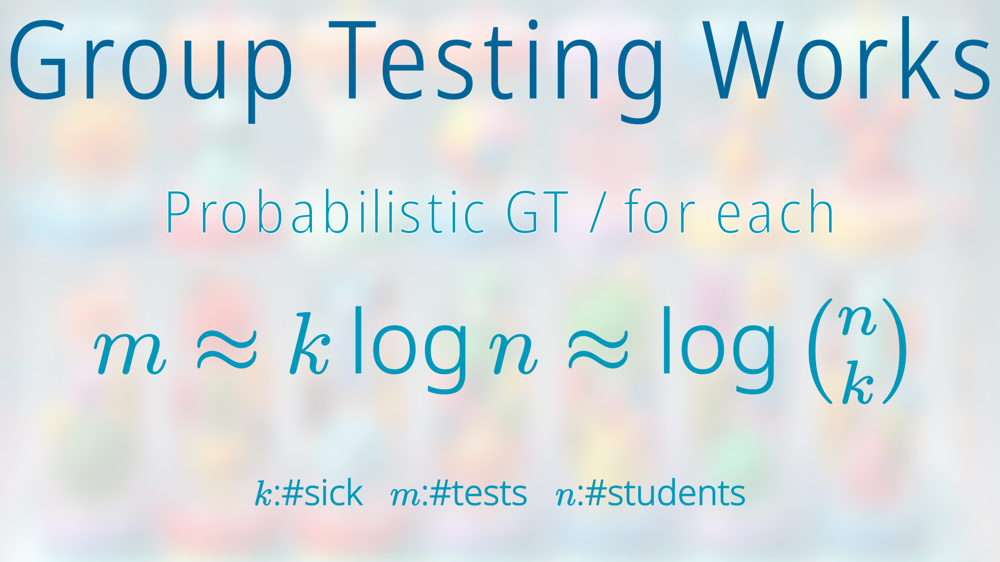

In [33]:
%%manim -qh -v WARNING D2_ForEach
class                  D2_ForEach(Scene):
    """
    Next we move on to probabilistic GT.
    In probabilistic GT, we allow the decoder to make mistakes.
    This relaxation will reduce the number of tests to about k log n.
    Note that k log n is roughly the logarithm of n choose k,
    and so this equation is saying that
    each test will give you one bit of information.
    You use that information to learn
    the ground truth that has n choose k possibilities.
    """
    def construct(self):
        t1 = Text('Probabilistic GT / for each', font_size=60)
        t2 = Tex(r'$m \approx k \log n \approx \log \binom nk$',
                 font_size=120)
        t3 = Tex(r'$k$:\#sick ~ $m$:\#tests ~ $n$:\#students')
                 
        t1.shift([0, 1, 0])
        t2.shift([0, -1, 0])
        t3.shift([0, -3, 0])
        self.add(bg)
        self.add(text_work, t1, t2, t3)

In [ ]:
%%manim -qh -v WARNING D2a_COMPDD
class                  D2a_COMPDD(Scene):
    """
    In this regime, COMP and DD are two very simple greedy decoder
    that performs reasonably well.
    They are not adaptive;
    they use very few tests;
    they have reasonably low decoding complexity
    and reasonably low error probability;
    the only drawback is that it cannot handle noisy test results.
    """
    def construct(self):
        work = JAS19
        self.add(bg)
        self.add(work[2])
        self.play(FadeIn(*work[:2], shift=UP), run_time=1)
        self.play(GrowFromCenter(VGroup(*work[3:])), run_time=1)

In [ ]:
%%manim -qh -v WARNING D2b_SPIV
class                  D2b_SPIV(Scene):
    """
    Coja-Oghlan et al. published a paper called optimal group testing.
    This one achieves the information theoretical lower bound
    on the number of tests with only two rounds.
    As you can see, the test axis gets a perfect score.
    But this design has a decoding complexity polynomial in k.
    """
    def construct(self):
        work = CGH21
        self.add(bg)
        self.add(work[2])
        self.play(FadeIn(*work[:2], shift=UP), run_time=1)
        self.play(GrowFromCenter(VGroup(*work[3:])), run_time=1)

In [ ]:
%%manim -qh -v WARNING D2c_WGG23
class                  D2c_WGG23(Scene):
    """
    So, instead of optimizing for number of tests,
    we can optimize for decoding complexity.
    If we do that, we obtain a nonadaptive splitting scheme.
    Here, splitting just means binary search.
    It is how group testing people called binary search.
    """
    def construct(self):
        work = WGG23
        self.add(bg)
        self.add(work[2])
        self.play(FadeIn(*work[:2], shift=UP), run_time=1)
        self.play(GrowFromCenter(VGroup(*work[3:])), run_time=1)

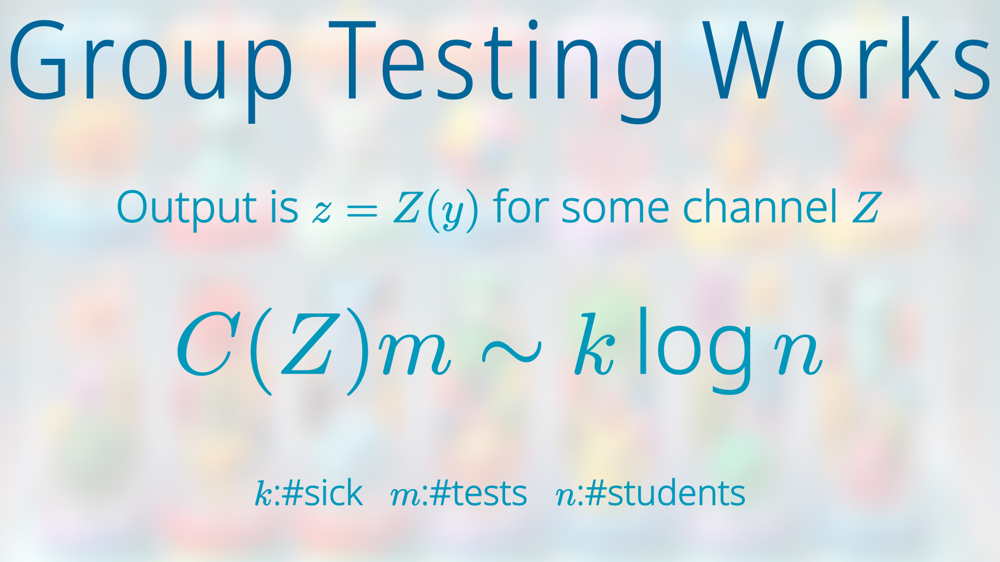

In [37]:
%%manim -qh -v WARNING D3_Noisy
class                  D3_Noisy(Scene):
    """
    Now we enter the noisy world.
    In the noisy world,
    the test result we see is not the actual test result.
    Instead, we see a vector z, which is the output of
    some binary channel Z applied to all the test result vector y.

    In this case, we have to change our estimate of the number of tests.
    We multiply the number of tests by the channel capacity
    and this quantity will be the amount of information
    we get by performing m test.
    We expect that C(Z)m product will be roughly k log n
    because we hope that every test will provide useful information.
    """
    def construct(self):
        t1 = Tex(r'Output is $z = Z(y)$ for some channel $Z$',
                 font_size=60)
        t2 = Tex(r'$C(Z) m \sim k \log n$', font_size=120)
        t3 = Tex(r'$k$:\#sick ~ $m$:\#tests ~ $n$:\#students')
                 
        t1.shift([0, 1, 0])
        t2.shift([0, -1, 0])
        t3.shift([0, -3, 0])
        self.add(bg)
        self.add(text_work, t1, t2, t3)

In [ ]:
%%manim -qh -v WARNING D3a_CJS14
class                  D3a_CJS14(Scene):
    """
    On the noisy side of the group testing world,
    Cai et al. proposed noisy COMP.
    This is the noise version of the greedy algorithm.
    It again performs reasonably well just like the noiseless version.
    The only drawback here is that their decoding complexity still
    involves iterating over all students which is sometimes not allowed.
    """
    def construct(self):
        work = CJS14
        self.add(bg)
        self.add(work[2])
        self.play(FadeIn(*work[:2], shift=UP), run_time=1)
        self.play(GrowFromCenter(VGroup(*work[3:])), run_time=1)

In [ ]:
%%manim -qh -v WARNING D3b_BCS21
class                  D3b_BCS21(Scene):
    """
    Bondorf et al. proposed bit-mixing coding.
    The idea is to divide students into several teams
    and apply Noisy COMP to those team.
    This work does everything Noisy COMP can do.
    An interesting feature of this work is that their error probability
    is roughly k^2 divided by the decoding complexity.
    This means that I can only halve the error probability.
    if I double the decoding complexity, with no extra cost.
    However, this interesting feature is also the weakness:
    If we want to achieve any nontrivial error probability,
    the complexity is at least k^2.
    """
    def construct(self):
        work = BCS21
        self.add(bg)
        self.add(work[2])
        self.play(FadeIn(*work[:2], shift=UP), run_time=1)
        self.play(GrowFromCenter(VGroup(*work[3:])), run_time=1)

In [ ]:
%%manim -qh -v WARNING D3c_PST23
class                  D3c_PST23(Scene):
    """
    This one is another interesting work where they generalize
    the idea of nonadaptive splitting to the noisy world.
    One annoying thing about noises is that you cannot trust
    any single test result, instead, you have to look at
    a series of test results before making any decision.
    This means that, when we are walking on a tree,
    we have to look ahead before we choose the right branch.
    Because of this, their decoding complexity is also not optimal.
    """
    def construct(self):
        work = PST23
        self.add(bg)
        self.add(work[2])
        self.play(FadeIn(*work[:2], shift=UP), run_time=1)
        self.play(GrowFromCenter(VGroup(*work[3:])), run_time=1)

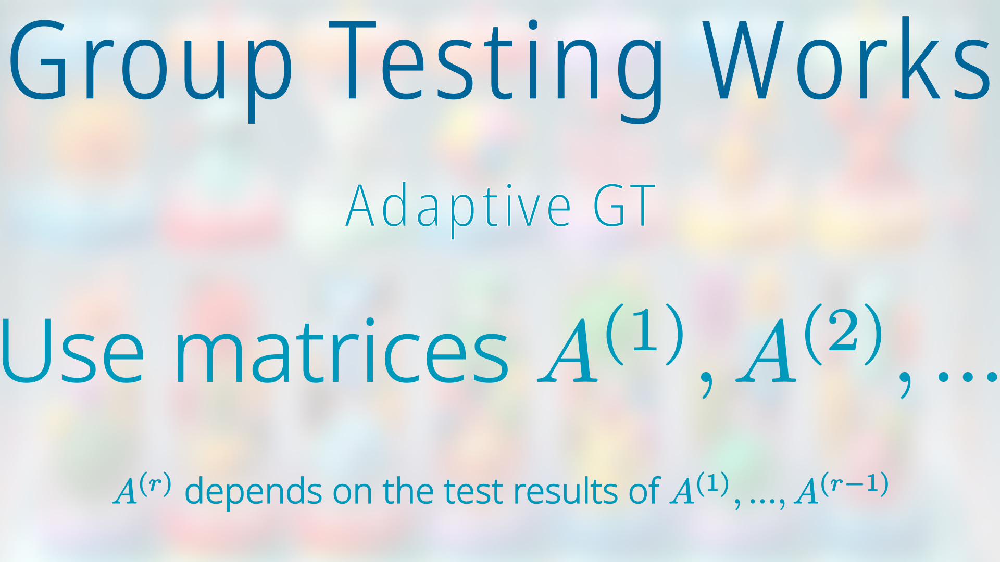

In [41]:
%%manim -qh -v WARNING D4_Adaptive
class                  D4_Adaptive(Scene):
    """
    Finally we make some remarks on adaptive group testing.
    """
    def construct(self):
        t1 = Text(r'Adaptive GT', font_size=60)
        t2 = Tex(r'Use matrices $A^{(1)}, A^{(2)}, ...$', font_size=120)
        t3 = '''
            $A^{(r)}$ depends on the test results
            of $A^{(1)}, ..., A^{(r-1)}$
        '''
        t3 = Tex(t3)
        t1.shift([0, 1, 0])
        t2.shift([0, -1, 0])
        t3.shift([0, -3, 0])
        self.add(bg)
        self.add(text_work, t1, t2, t3)

In [ ]:
%%manim -qh -v WARNING D4a_CJB17
class                  D4a_CJB17(Scene):
    """
    GROTESQUE = G T QUick Efficient
    
    GROTESQUE is another important work
    and we will talk about that later.
    For now, let me remark that a version of GROTESQUE
    uses $O(\log k)$ rounds to achieve the optimal decoding complexity.
    """
    def construct(self):
        work = CJB17
        self.add(bg)
        self.add(work[2])
        self.play(FadeIn(*work[:2], shift=UP), run_time=1)
        self.play(GrowFromCenter(VGroup(*work[3:])), run_time=1)

In [ ]:
%%manim -qh -v WARNING D4b_Sca19
class                  D4b_Sca19(Scene):
    """
    For the last paper of literature review, we have Scarlett's work
    who uses four tests to achieve a very good number of tests.
    The nice thing about this work compared to optimal group testing
    is that the decoding time is improved from polynomial to k^2.
    """
    def construct(self):
        work = Sca19
        self.add(bg)
        self.add(work[2])
        self.play(FadeIn(*work[:2], shift=UP), run_time=1)
        self.play(GrowFromCenter(VGroup(*work[3:])), run_time=1)

## Gacha

In [44]:
gacha_color = '#9900BB'

In [ ]:
%%manim -qh -v WARNING E1_ThisWork
class                  E1_ThisWork(Scene):
    """
    In this work we introduce a group testing scheme called Gacha GT.
    This name comes from gacha machines.
    To use a gacha machine,
    you insert a coin to obtain a random action figure.
    And the goal is to collect the full set of action figures.
    In our case, tests are the coins,
    the test results are the action figures,
    and we want to collect the data of every sick student.
    """
    def construct(self):
        GACHAGT = Paragraph(
            'GACHA',
            'GT',
            alignment='right', font_size=140, color=gacha_color)
        fig = ImageMobject('gacha.jpg')
        cap = Text('ChatGPT', font_size=20, color='#111111', opacity=1)
        fig.scale(1).shift([3, 0, 0])
        cap.shift([6, -3.5, 0])
        GACHAGT.shift([3, 0, 0])
        GACHAGT.generate_target()
        GACHAGT.target.shift([-7, 0, 0])
        self.add(bg)
        self.add(GACHAGT, fig, cap)
        self.play(MoveToTarget(GACHAGT), run_time=2, lag_ratio=1/10)

In [ ]:
%%manim -qh -v WARNING E2_OurPentagon
class                  E2_OurPentagon(Scene):
    """
    Our group testing scheme has this pentagon.
    It is completely nonadaptive,
    it can resists noises produced by any channel,
    and it has the lowest possible decoding complexity.
    The number of tests is not perfect because we are
    a constant scalar away from the information theoretical bound
    (but still impressive enough).
    The number of errors is not perfect but at least
    the averaged number of errors per sick student converges to zero.
    """
    def construct(self):
        other = VGroup(
            KaS64[-1].copy().scale(1/3).shift([-6, 3, 0]),
            ChN20[-1].copy().scale(1/3).shift([-6, 0, 0]),
            JAS19[-1].copy().scale(1/3).shift([-6, -3, 0]),
            CGH21[-1].copy().scale(1/3).shift([-4, 1.5, 0]),
            WGG23[-1].copy().scale(1/3).shift([-4, -1.5, 0]),
            CJS14[-1].copy().scale(1/3).shift([4, 3, 0]),
            BCS21[-1].copy().scale(1/3).shift([4, 0, 0]),
            PST23[-1].copy().scale(1/3).shift([4, -3, 0]),
            Sca19[-1].copy().scale(1/3).shift([6, 1.5, 0]),
            CJB17[-1].copy().scale(1/3).shift([6, -1.5, 0]),
        )
        our = Pentagon([A.na, B.bigO, C.any, D.klog, E.ok])
        our.set_color(gacha_color)
        our = VGroup(arm_text, star.copy(), our)
        gacha = Text('Gacha GT', font_size=80, color=gacha_color)
        gacha.shift([0, -3, 0])
        other.shift([-4, 0.8, 0])
        self.add(bg)
        self.add(other, gacha)
        self.play(GrowFromCenter(our), run_time=1)

## GROTESQUE

In [47]:
grotesque = Text('Idea of GROTESQUE', font_size=100)
grotesque.shift([0, 3, 0]).set_color(structure_color)

Text('Idea of GROTESQUE')

In [ ]:
%%manim -qh -v WARNING F1_SimpleIdea
class                  F1_SimpleIdea(Scene):
    """
    Before we get into the details of our group testing scheme.
    we first go over the idea of GROTESQUE.
    Let us begin with the assumption that
    tests are noiseless and only one student is sick.
    A reasonable thing to do here
    is to give every student a unique binary number.
    So the first student is given 001,
    the second student is given 010,
    the third student is given 011,
    and so on.
    """
    def construct(self):
        bracket = r'''
            $$A = \left[ \rule{0cm}{0.7cm}\rule{3cm}{0cm} \right]$$
        '''
        bracket = Tex(bracket, font_size=80)
        students = []
        for x in range(1, 8):
            s = Emoji('🧑‍🎓')
            s.scale(1/6).shift([x+1/2, 0, 0])
            students.append(s)
            if x == 3:
                v = Emoji('🦠')
                v.scale(1/6).shift([x+1/2, 0, 0]).shift([1/6, 1/6, 0])
                students.append(v)
        students = Group(*students)
        tubes = []
        for y in range(3):
            t = Emoji('🧪')
            t.scale(1/4).shift([0, y+1/2, 0])
            tubes.append(t)
        tubes = Group(*tubes)
        cells = []
        for x in range(1, 8):
            for y in range(3):
                c = bin(1024 + x)
                c = c[-1-y]
                c = Tex(f'${c}$', font_size=80)
                c.shift([x+1/2, y+1/2, 0])
                cells.append(c)
        cells = VGroup(*cells)
        bracket.shift([-0.5, -0.5, 0])
        students.shift([-4, 1.5, 0])
        tubes.shift([5, -2, 0])
        cells.shift([-4, -2, 0])
        self.add(bg)
        self.add(grotesque, bracket, students, tubes)
        self.play(FadeIn(cells, shift=DOWN), run_time=5, lag_ratio=1/5)

In [ ]:
%%manim -qh -v WARNING F2_SimpleBatch
class                  F2_SimpleBatch(Scene):
    """
    Next we consider the case where there are two sick students.
    A reasonable thing to do here is to divide
    the students into two teams and double the number of tests.

    We let the first team of students put their binary numbers
    into the first batch of tests.
    The second team of students put their binary numbers
    into the second batch of tests.

    You can easily see the pros and cons of this approach.
    The pros is that if each team contains one sick student,
    we will be able to read out their binary numbers.
    But if two sick students appears in the same team,
    then their binary number will be bitwise-or-ed together.
    This is called an overlapping error.
    And we do not like overlapping error.
    """
    def construct(self):
        bracket = r'''
            $$A = \left[ \rule{0cm}{1.4cm}\rule{3cm}{0cm} \right]$$
        '''
        bracket = Tex(bracket, font_size=80)
        students = []
        for x in range(1, 8):
            s = Emoji('🧑‍🎓')
            s.scale(1/6).shift([x+1/2, 0, 0])
            students.append(s)
            if x in [2, 4]:
                v = Emoji('🦠')
                v.scale(1/6).shift([x+1/2, 0, 0]).shift([1/6, 1/6, 0])
                students.append(v)
        students = Group(*students)
        tubes = []
        for y in range(6):
            t = Emoji('🧪')
            t.scale(1/6).shift([0, y+1/2, 0])
            tubes.append(t)
        tubes = Group(*tubes)
        cells = []
        for x in range(1, 8):
            b = bin(1024 + x)
            for y in range(3):
                c = b[-1-y]
                c = Tex(f'${c}$', font_size=80)
                c.shift([x+1/2-8/2, y+1/2-2, 0])
                c.generate_target()
                c.target.shift([0, ((x//4) - 1/2) * 3, 0])
                cells.append(c)
        cells = VGroup(*cells)
        bracket.shift([-0.5, -0.5, 0])
        students.shift([-4, 3, 0])
        tubes.shift([5, -3.5, 0])
        self.add(bg)
        self.add(grotesque, bracket, students, tubes, cells)
        self.play(*[MoveToTarget(c) for c in cells], run_time=1)

In [ ]:
%%manim -qh -v WARNING F3_MoreBatch
class                  F3_MoreBatch(Scene):
    """
    To solve the overlapping error, we can divide
    the students into more teams and tests into more batches.
    In this case, more means four.
    This way, there is a higher probability that
    no two sick students share the same batch of tests.

    But that doesn't quite solve the problem yet, because it is
    still possible that two sick students will overlap.

    But at least there is an easy way
    to detect overlapping batches:
    Instead of binary numbers from 1 to n,
    we use a constant weight code to label the students.
    This way, if the Hamming weight of any batch
    is greater than the predefined weight,
    we know it is because there are two sick students
    whose labels are bitwise-or-ed together.
    """
    def construct(self):
        bracket = r'''
            $$A = \left[ \rule{0cm}{1.3cm}\rule{3.3cm}{0cm} \right]$$
        '''
        bracket = Tex(bracket, font_size=80)
        students = []
        for x in range(1, 32):
            s = Emoji('🧑‍🎓')
            s.scale(1/12).shift([(x+1/2) / 4, 0, 0])
            students.append(s)
            if x in [10, 15, 20, 25]:
                v = Emoji('🦠')
                v.scale(1/12)
                v.shift([(x+1/2) / 4, 0, 0]).shift([1/12, 1/12, 0])
                students.append(v)
        students = Group(*students)
        tubes = []
        for y in range(20):
            t = Emoji('🧪')
            t.scale(1/12).shift([0, (y+1/2) / 4, 0])
            tubes.append(t)
        tubes = Group(*tubes)
        cells = []
        for x in range(1, 32):
            b = bin(1024 + x)
            for y in range(5):
                c = b[-1-y]
                c = Tex(f'${c}$', font_size=40)
                c.shift([(x+1/2-28/2) / 4, (y+1/2-5) / 4, 0])
                c.generate_target()
                c.target.shift([0, ((x//8) - 3/2) * 5/4, 0])
                cells.append(c)
        cells = VGroup(*cells)
        bracket.shift([-0.5, -0.5, 0])
        students.shift([-3.5, 2.5, 0])
        tubes.shift([5, -3, 0])
        self.add(bg)
        self.add(grotesque, bracket, students, tubes, cells)
        self.play(*[MoveToTarget(c) for c in cells], run_time=1)

In [ ]:
%%manim -qh -v WARNING F4_RandomBatch
class                  F4_RandomBatch(Scene):
    """
    Now we know it is possible to detect overlapping.
    To solve the overlapping problem completely,
    GROTESQUE uses a smart idea.
    The idea is to ask each student
    to participate in two random batches of tests.
    In each batch the student will write down a binary number
    or a codeword of some constant weight code on the matrix A,
    meaning that they want to participate in these tests.
    This way, if one of the batches is overlapping, we still have
    another chance to recover the identity of the sick student.
    """
    def construct(self):
        bracket = r'''
            $$A = \left[ \rule{0cm}{1.3cm}\rule{3.3cm}{0cm} \right]$$
        '''
        bracket = Tex(bracket, font_size=80)
        students = []
        for x in range(1, 32):
            s = Emoji('🧑‍🎓')
            s.scale(1/12).shift([(x+1/2) / 4, 0, 0])
            students.append(s)
            if x in [10, 15, 20, 25]:
                v = Emoji('🦠')
                v.scale(1/12)
                v.shift([(x+1/2) / 4, 0, 0]).shift([1/12, 1/12, 0])
                students.append(v)
        students = Group(*students)
        tubes = []
        for y in range(20):
            t = Emoji('🧪')
            t.scale(1/12).shift([0, (y+1/2) / 4, 0])
            tubes.append(t)
        tubes = Group(*tubes)
        cells = []
        for x in range(1, 32):
            b = bin(1024 + x)
            for r in rng.choice(4, 2, False):
                for y in range(5):
                    c = b[-1-y]
                    c = Tex(f'${c}$', font_size=40)
                    c.shift([(x+1/2-28/2) / 4, (y+1/2-5) / 4, 0])
                    c.generate_target()
                    c.target.shift([0, (r-3/2) * 5/4, 0])
                    cells.append(c)
        cells = VGroup(*cells)
        bracket.shift([-0.5, -0.5, 0])
        students.shift([-3.5, 2.5, 0])
        tubes.shift([5, -3, 0])
        self.add(bg)
        self.add(grotesque, bracket, students, tubes, cells)
        self.play(*[MoveToTarget(c) for c in cells], run_time=1)

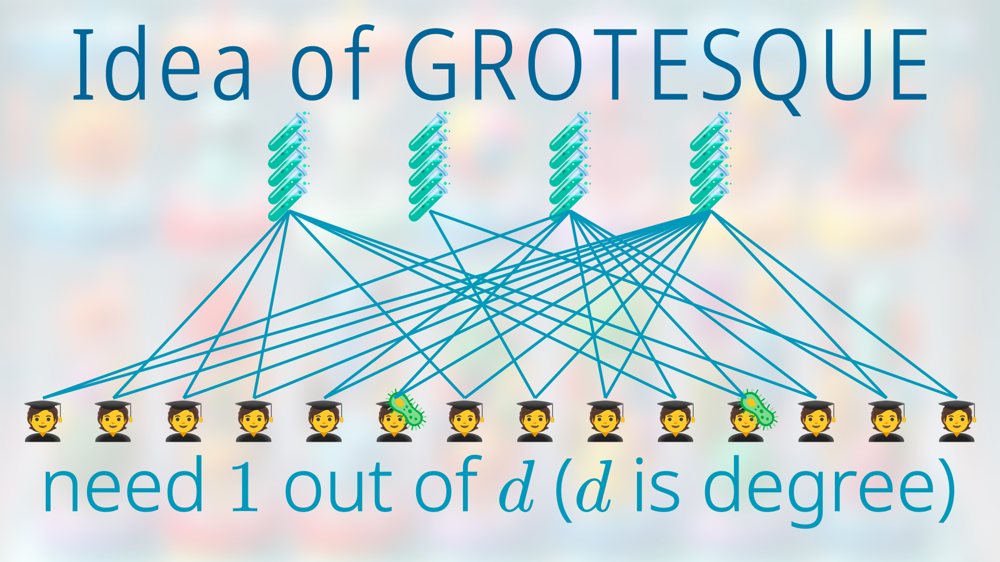

In [52]:
%%manim -qh -v WARNING F5_Expander
class                  F5_Expander(Scene):
    """
    An better way to visualize the idea of GROTESQUE
    is to imagine a bipartite graph where the bottom part
    is students and the upper part is batches of tests.
    Each student will choose two batches of tests.
    In each batch, the student will write down
    some codeword of some constant weight code.

    You can immediately see how this design
    solves the overlapping problem.
    After we obtain the test results, we first check the Hamming weight
    of each batch, and if we see a Hamming weight that is greater than
    the predefined weight, we know this is an overlapping here.
    On the other hand, if the weight is correct,
    we will be able to recover the codeword of the sick student.

    So now, the problem is, is it still possible that
    two students just choose the same set of batches.
    The short answer is yes, overlapping is still possible.
    However, we can use random graphs, and we know that
    random graphs have unique neighbor property with high probability.
    The unique neighbor property is a variant of the expander property.
    Basically it says that, if you choose a subset of students
    and call them sick, then every sick student has a unique neighbor.
    This unique neighbor is going to be a batch of tests
    that does not contains other sick people.
    And so we can recover the codeword of the sick student.

    But after thinking about this for a while
    you will be able to see why this scheme could be suboptimal.
    The problem is with the number of tests.
    If we want to achieve the information theoretical lower bound
    on the number of tests, then it better be that
    every test gives us one bit of information.
    If one full bit is not possible, then we want that each test
    should at least give us a constant bits of information.
    But in the GROTESQUE case, if each student connect to d batches,
    we only need one batch out of d to recover the information.
    This means that, on average,
    each test will contribute at most 1/d bits of information.
    If d, the degree, is unbounded when the number of students
    goes to infinity, then we can not achieve even constant rate.
    """
    def construct(self):
        students = []
        for x in range(14):
            s = Emoji('🧑‍🎓')
            s.scale(1/6).shift([x+1/2, 0, 0])
            students.append(s)
            if x in [5, 10]:
                v = Emoji('🦠')
                v.scale(1/6)
                v.shift([x+1/2, 0, 0]).shift([1/6, 1/6, 0])
                students.append(v)
        students = Group(*students)
        tubes = []
        for x in range(4):
            for y in range(5):
                t = Emoji('🧪')
                t.scale(1/6).shift([(x+1/2) * 2, (y+1/2) / 4, 0])
                tubes.append(t)
        tubes = Group(*tubes)
        edges = []
        for x in range(14):
            for r in rng.choice(4, 2, False):
                p1 = [x+1/2-14/2, -2+1/3, 0]
                p2 = [(r+1/2-4/2) * 2, 1, 0]
                l = Line(p1, p2)
                edges.append(l)
        edges = VGroup(*edges)
        outof = 'need $1$ out of $d$ ($d$ is degree)'
        outof = Tex(outof, font_size=100)
        students.shift([-7, -2, 0])
        tubes.shift([-4, 1, 0])
        outof.shift([0, -3, 0])
        self.add(bg)
        self.add(grotesque, students, tubes, edges, outof)

## Gacha

In [53]:
text_gacha = Text('Idea of Gacha GT', font_size=100)
text_gacha.shift([0, 3, 0]).set_color(gacha_color)

Text('Idea of Gacha GT')

In [54]:
students = []
for x in range(14):
    s = Emoji('🧑‍🎓')
    s.scale(1/6).shift([x+1/2, 0, 0])
    students.append(s)
    if x in [5, 10]:
        v = Emoji('🦠')
        v.scale(1/6)
        v.shift([x+1/2, 0, 0]).shift([1/6, 1/6, 0])
        students.append(v)
students = Group(*students)
students.shift([-7, -2, 0])

Group

In [55]:
tubes = []
for x in range(7):
    for y in range(3):
        t = Emoji('🧪')
        t.scale(1/6).shift([(x+1/2) * 2, (y+1/2) / 4, 0])
        tubes.append(t)
tubes = Group(*tubes)
tubes.shift([-7, 1, 0])

Group

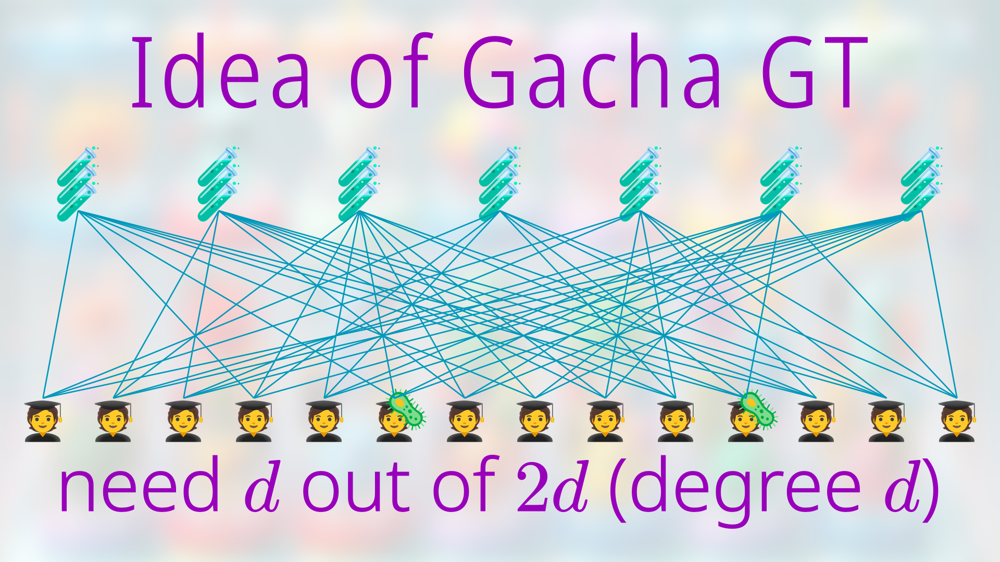

In [56]:
%%manim -qh -v WARNING G1_GachaIdea
class                  G1_GachaIdea(Scene):
    """
    We propose Gacha GT to solve the problem of low information rate.
    The information rate is low, let me emphasize,
    because we only need one batch to recover the information.
    In order to solve this, we break the assumption
    that one batch is enough to recover the information.
    Our solution will look like this,
    each student will participate in 2d batches of tests
    where each batch contains fewer tests than before.
    This means that each batch contains less information than before
    and so we need d batches to recover the information.
    If this is actually doable, the code rate will be 1/2.
    """
    def construct(self):
        edges = []
        for x in range(14):
            for r in rng.choice(7, 4, False):
                p1 = [x+1/2-14/2, -2+1/3, 0]
                p2 = [(r+1/2-7/2) * 2, 1, 0]
                l = Line(p1, p2, stroke_width=2)
                edges.append(l)
        edges = VGroup(*edges)
        outof = r'need $d$ out of $2d$ (degree $d$)'
        outof = Tex(outof, font_size=100, color=gacha_color)
        outof.shift([0, -3, 0])
        self.add(bg)
        self.add(text_gacha, students, tubes, edges, outof)

In [57]:
polys = []
for x in range(14):
    g = Tex(f'$g_{{{x}}}$', color='#333333', font_size=60)
    g.shift([x + 1/2, -2/3, 0])
    polys.append(g)
polys = Group(*polys)
polys.shift([-7, -2, 0])

Group

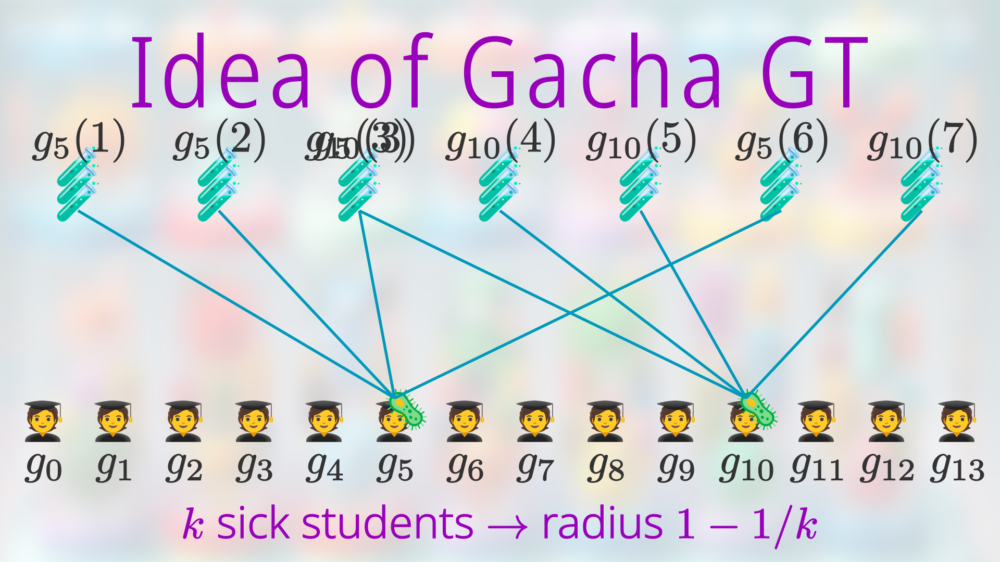

In [58]:
%%manim -qh -v WARNING G2_ReedSolomon
class                  G2_ReedSolomon(Scene):
    """
    So you probably already see where this is going...
    In order to achieve the "d out of 2d" effect,
    we will use Reed--Solomon codes.
    We will use one polynomial to represent one student;
    the polynomials are denoted by g because they are graduate students.
    And then the graduate students will put the evaluations
    of the polynomials into the batches of tests, like this.

    And so we reduce the group testing problem
    to a problem of Reed--Solomon codes:
    That is, given a word of the form
    g5(1) g5(2) some garbage g10(4) g10(5) g5(6) g10(7),
    can you tell me the polynomials g5 and g10?

    So Some of you in the audience probably recognize that
    this is the classical list decoding problem.
    But let me remind you that our setting is very very untraditional.
    You see, because there will be k sick students, only 1/k
    of the batches will contain information from the same student.
    
    This means that our list decoding radius is about 1 - 1/k.
    Note that radius 1 means that we want every polynomial,
    and so our radius is only 1/k away from including all polynomials.
    If we want our decoder to output a reasonable amount of polynomials,
    we will have to put restrictions
    on the other parameters of Reed--Solomon codes.
    For instance, we might want to make the degree of polynomials
    to be very low so they all have very few roots
    and so any two random polynomials are far away from each other.
    But if you carry out the computation you will see that
    it is very hard to find a list decoding construction that does help.
    """
    def construct(self):
        edges = []
        for x in [5, 10]:
            for r in {5:[0,1,2,5], 10:[2,3,4,6]}[x]:
                p1 = [x+1/2-14/2, -2+1/3, 0]
                p2 = [(r+1/2-7/2) * 2, 1, 0]
                g = f'$g_{{{x}}}({r+1})$'
                g = Tex(g, color='#333333', font_size=60)
                g.shift([(r+1/2-7/2) * 2, 2, 0])
                l = Line(p1, p2)
                edges.append(l)
                edges.append(g)
        edges = VGroup(*edges)
        ksick = r'$k$ sick students $\to$ radius $1 - 1/k$'
        ksick = Tex(ksick, font_size=60, color=gacha_color)
        ksick.shift([0, -3.5, 0])
        self.add(bg)
        self.add(text_gacha, students, polys, tubes, edges, ksick)

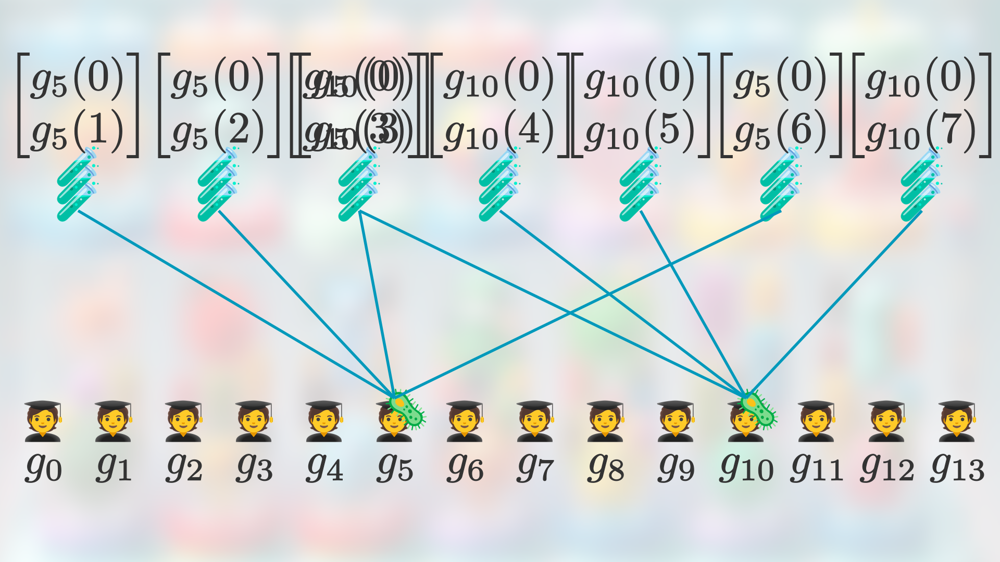

In [59]:
%%manim -qh -v WARNING G3_FoldedRS
class                  G3_FoldedRS(Scene):
    """
    We end up using a special construction
    that is similar to a folded RS code but not quite.
    What we do here is that, on top of the evaluations at 1234567,
    we also include the evaluation at 0 at every batch.
    The reasoning behind this change is that,
    with high probability, g5(0) and g10(0) are different.
    Therefore, we can classify the batches of tests
    by the first component we see.
    In this case, 1, 2, and 5 will be classified together;
    4, 5, and 7 will be classified together.
    Once we have the classification, we can interpolate
    the second component using any RS decoder.
    """
    def construct(self):
        edges = []
        for x in [5, 10]:
            for r in {5:[0,1,2,5], 10:[2,3,4,6]}[x]:
                p1 = [x+1/2-14/2, -2+1/3, 0]
                p2 = [(r+1/2-7/2) * 2, 1, 0]
                g = f'g_{{{x}}}(0)' r'\\' f'g_{{{x}}}({r+1})'
                g = r'$\begin{bmatrix}' f'{g}' r'\end{bmatrix}$'
                g = Tex(g, color='#333333', font_size=60)
                g.shift([(r+1/2-7/2) * 2, 2.5, 0])
                l = Line(p1, p2)
                edges.append(l)
                edges.append(g)
        edges = VGroup(*edges)
        self.add(bg)
        self.add(students, polys, tubes, edges)

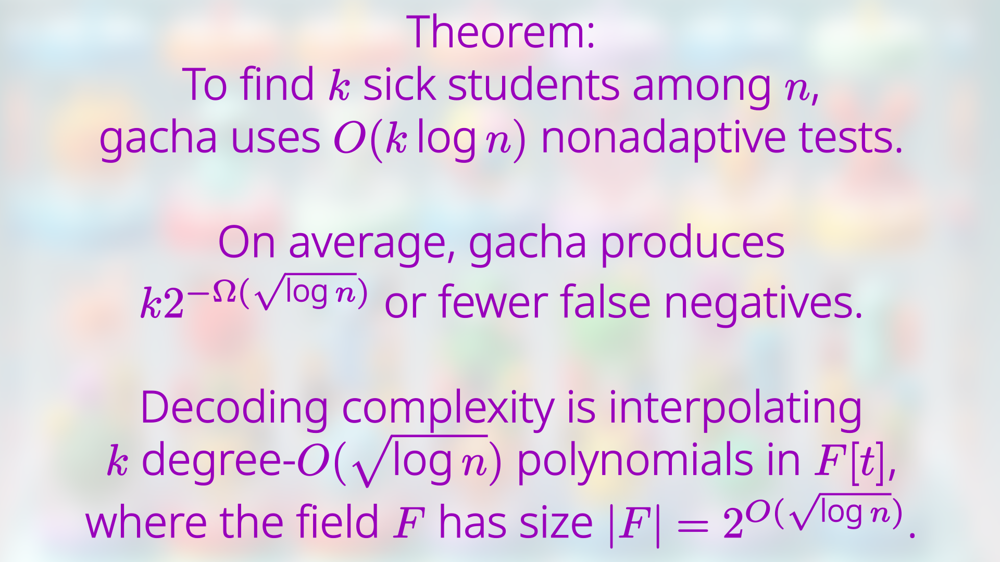

In [60]:
%%manim -qh -v WARNING G4_Theorem
class                  G4_Theorem(Scene):
    """
    Modulo some computations, the technique introduced
    in the previous slide achieves the following parameter.

    Any question so far?
    """
    def construct(self):
        theorem = r'''
            Theorem:
            \\ To find $k$ sick students among $n$,
            \\ gacha uses $O(k \log n)$ nonadaptive tests.
            \\ ~
            \\ On average, gacha produces
            \\ $k2^{-\Omega(\sqrt{\log n})}$ or fewer false negatives.
            \\ ~
            \\ Decoding complexity is interpolating
            \\ $k$ degree-$O(\sqrt{\log n})$ polynomials in $F[t]$,
            \\ where the field $F$ has size
               $|F| = 2^{O(\sqrt{\log n})}$.
        '''
        theorem = Tex(theorem, font_size=60, color=gacha_color)
        self.add(bg)
        self.add(theorem)

## Pyramid

In [61]:
students = []
for x in range(6):
    s = Emoji('🧑‍🎓')
    s.scale(1/6).shift([(x+1/2) * 2, 0, 0])
    students.append(s)
students = Group(*students)
tubes = []
for x in range(4):
    for y in range(3):
        t = Emoji('🧪')
        t.scale(1/6).shift([(x+1/2) * 3, (y+1/2) / 2, 0])
        tubes.append(t)
tubes = Group(*tubes)
edges = []
for x in range(6):
    for r in [[0,1], [0,2], [0,3], [1,2], [1,3], [2,3]][x]:
        p1 = [(x+1/2-6/2) * 2, -2.5+1/3, 0]
        p2 = [(r+1/2-4/2) * 3, 2, 0]
        l = Line(p1, p2)
        edges.append(l)
edges = VGroup(*edges)
students.shift([-6, -2.5, 0])
tubes.shift([-6, 2, 0])
equation = Tex(r'\#students in small GT = $|F|^2$ in big GT')
equation.shift([0, -3.5, 0])

Tex('\\#students in small GT = $|F|^2$ in big GT')

In [ ]:
%%manim -qh -v WARNING H1_Preparing
class                  H1_Preparing(Scene):
    """
    If there is no question,
    I want to introduce the last technique of my talk.
    I promised in the title of the talk that we use stacked
    list recoverable codes to construct group testing scheme.
    By that I mean we want to create a recursive structure
    of group testing schemes as shown in the animation.
    """
    def construct(self):
        self.add(bg)
        self.add(equation)
        self.play(FadeIn(tubes))
        self.wait(1)
        self.play(FadeIn(students), FadeIn(edges))
        self.wait(1)

In [63]:
GT = Group(students, tubes, edges)
students2 = students.copy()
edges2 = edges.copy()
tubes2 = []
for x in range(4):
    gt = GT.copy()
    gt.generate_target()
    gt.target.scale([1/8, 1/4, 1])
    gt.target.shift([(x+1/2-4/2) * 3, 2.5, 0])
    tubes2.append(gt)

In [ ]:
%%manim -qh -v WARNING H2_Stacking
class                  H2_Stacking(Scene):
    """
    At the bottom of the graph,
    we have students which we know correspond to polynomials.
    At the top of the graph we have tubes,
    which are pairs of evaluations over some large field.
    The recursive structure is such that,
    an evaluation pair will be mapped to
    a small polynomial over some small field,
    and those polynomials will generate more evaluations.
    The evaluations will be mapped to even smaller polynomials.
    """
    def construct(self):
        self.add(bg)
        self.add(equation)
        self.add(tubes2[0])
        self.play(*[MoveToTarget(gt) for gt in tubes2])
        self.wait(1)
        self.play(FadeIn(students2), FadeIn(edges2))
        self.wait(1)

In [65]:
GT2 = Group(*students2, *tubes2, *edges2)
students3 = students.copy()
edges3 = edges.copy()
tubes3 = []
for x in range(4):
    gt = GT2.copy()
    gt.generate_target()
    gt.target.scale([1/8, 1/4, 1])
    gt.target.shift([(x+1/2-4/2) * 3, 2.5, 0])
    tubes3.append(gt)

In [ ]:
%%manim -qh -v WARNING H3_Recursing
class                  H3_Recursing(Scene):
    """
    By repeating this recursive architecture multiple time,
    we can bootstrap the error probability to almost 1/n,
    where n is the number of students.
    This implies that, if the number of sick students
    does not grow too fast compared to n,
    we will have an error probability that converge to zero.
    """
    def construct(self):
        self.add(bg)
        self.add(equation)
        self.add(tubes3[0])
        self.play(*[MoveToTarget(gt) for gt in tubes3])
        self.wait(1)
        self.play(
            FadeOut(*tubes3),
            FadeIn(*tubes2), FadeIn(students3), FadeIn(edges3)
        )
        self.wait(1)

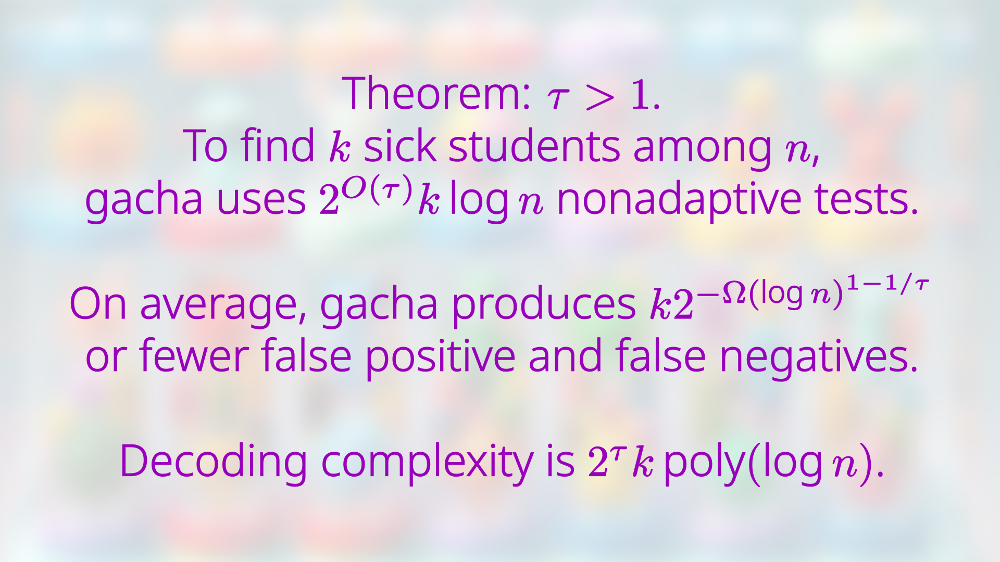

In [67]:
%%manim -qh -v WARNING H4_BigTheorem
class                  H4_BigTheorem(Scene):
    """
    Here is our statement of stacked GT scheme.

    Read the statement.

    whether or not this group testing scheme
    outperforms existing schemes depends on
    how big n is compared to other parameters.
    If log n is greater than a constant power of log k,
    then this term becomes less than 1 and decays to zero very fast.
    """
    def construct(self):
        theorem = r'''
            Theorem: $\tau > 1$.
            \\ To find $k$ sick students among $n$,
            \\ gacha uses $2^{O(\tau)} k \log n$ nonadaptive tests.
            \\ ~
            \\ On average, gacha produces
               $k 2^{-\Omega(\log n)^{1-1/\tau}}$
            \\ or fewer false positive and false negatives.
            \\ ~
            \\ Decoding complexity is
               $2^\tau k \operatorname{poly}(\log n)$.
        '''
        theorem = Tex(theorem, font_size=60, color=gacha_color)
        self.add(bg)
        self.add(theorem)

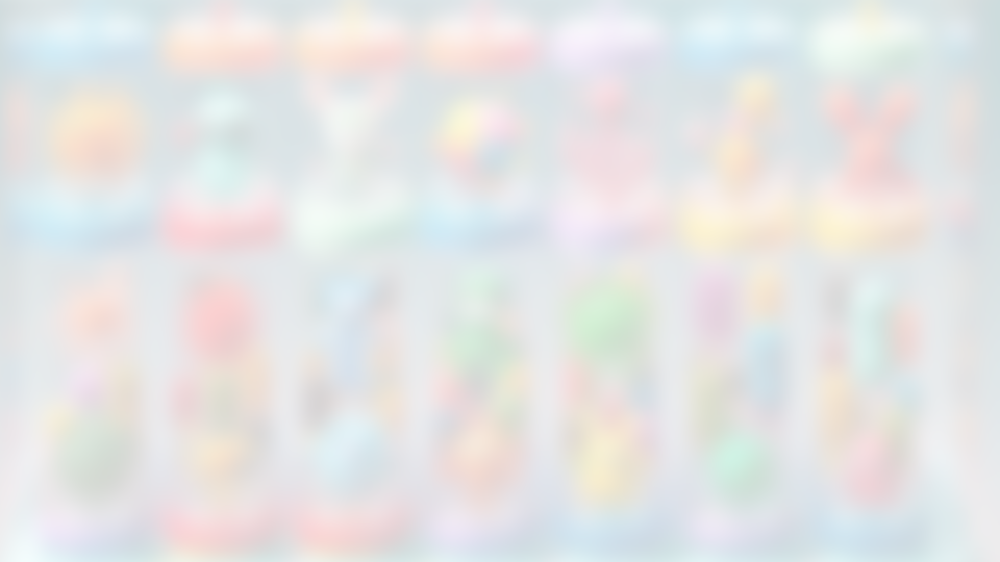

In [68]:
%%manim -qh -v WARNING H5_Empty
class                  H5_Empty(Scene):
    """
    """
    def construct(self):
        self.add(bg)